![picture](https://drive.google.com/uc?id=1CI8OLC85ukIA2aozCyPvZwqta9do8l8f)
<font size="2">Four MR images of one person’s brain. From the left: T1, T1C, T2, FLAIR. Source: Pereira et al </font>
# Brain MRI Tumor Segmentation wih 3D-Unet

 This is the practice for the papper [3D U-net](https://arxiv.org/abs/1606.06650). 

 ## Outline
 This project can be devided into several parts:
 - [1. Overview of the flow](#1)
 - [2. Dataset and Preprocessing](#2)
  - [2.1 Explore the dataset](#2.1)
  - [2.2 Sub-volume sampling](#2.2)
  - [2.3 Normalization](#2.3)
 - [3. Model and Loss function](#3)
  - [3.1 Model Structure](#3-1)
  - [3.2 Multi-class soft dice loss](#3.2)
 - [4. Training](#4)
 - [5. Evaluate the result](#5)
  - [5.1 Input for prediction](#5.1)
  - [5.2 Sensitivity and Specifitivity](#5.2)
  - [5.3 Visualization](#5.3)

<a name="1"></a>
# 1. Overview of the flow:


## Before Starting
- Download the dataset from [Decathlon 10 Challenge](https://decathlon-10.grand-challenge.org). Choose `Task01_BrainTumour` and unpack.
- Prepare the file path like the following:

  in root: 
  
  (file) `generator.py` , `model.py`, `preprocess.py`, `utils.py`, `visualize.py`
  
  (dir)  `Task01_BrainTumour`,  `preprocess/train`,  `preprocess/validation`, `tmp`

## Process Flow
-  For normalization, the samples will be calculated the mean ans standard deviation in advance and saved as json file.
-  The raw image will be devides into patches (also normalized) to reduce memory usage.
- generator is used to create patches and load from patches for training.

<img src="https://drive.google.com/uc?id=13LcnVkQU6T8Wp1N6h1L03nvs6_fedzC9" width="80%">

## Import Packages
We will use keras in tensorflow.
#####Self-defined module:
- preprocess.py: create the patches needed for training.
- utils.py: some useful fuctions
- visualize.py: used to draw plots and visulization
- generator.py: define the generator for reading the raw data (for generating pathces) or reading the patches (for training process)
- model.py: define the 3D Unet structure 

In [0]:
import json
import numpy as np
import pandas as pd
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
import os
from datetime import date
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger

from visualize import *
from utils import *
from model import *
from generator import *
from preprocess import create_h5py_pathes
#Using channel first as default order
K.set_image_data_format('channels_first')

Using TensorFlow backend.


<a name="2"></a>
# 2. Dataset and Preprocessing
MRI (Magnetic resonance imaging) works by detecting the radio waves from atoms subjected to magnetic field.

In this practice, we will be using the data from the [Decathlon 10 Challenge](https://decathlon-10.grand-challenge.org). This data has been mostly pre-processed for the competition participants.

<a name=2.1></a>
## 2.1 Explore the dataset
The dataset is stored in NifTl-1 format which needs NiBabel library to interact with files.

There are `imagesTr` and  `imagesTs` in `Task01_BrainTumour` which contains images and labels respectively with 484 samples.
-  MRI images are 4D arrays with shape (240, 240, 155, 4), the last dimension have four channels which are:
  - 0: FLAIR: "Fluid Attenuated Inversion Recovery" (FLAIR)
  - 1: T1w: "T1-weighted"
  - 2: t1gd: "T1-weighted with gadolinium contrast enhancement" (T1-Gd)
  - 3: T2w: "T2-weighted"
- The labels are 3D arrays with shape (240, 240, 155). Each voxel has integer which shows one of the four class.
  - 0: background
  - 1: edema
  - 2: non-enhancing tumor
  - 3: enhancing tumor

Thus, we can define some global parameters:

In [0]:
#define global parameters
DATA_DIR = "Task01_BrainTumour"
IMG_DIR = os.path.join(DATA_DIR, "imagesTr")
LAB_DIR = os.path.join(DATA_DIR, "labelsTr")
NUM_CH = 4
CHANNEL = {
0: "FLAIR",                #"Fluid Attenuated Inversion Recovery" (FLAIR)
1: "T1-weighted",          #"T1-weighted"
2: "T1-weighted with Gd",  #"T1-weighted with gadolinium contrast enhancement" (T1-Gd)
3: "T2-weighted"           #"T2-weighted"
}
LABEL = {
0: "background",
1: "edema",
2: "non-enhancing tumor",
3: "enhancing tumor",
}
NUM_LAB = len(LABEL)
val_split = 0.2
input_dim = (240, 240, 155)
input_sub_dim = (120, 120, 32)

Now, we can visualiz the data

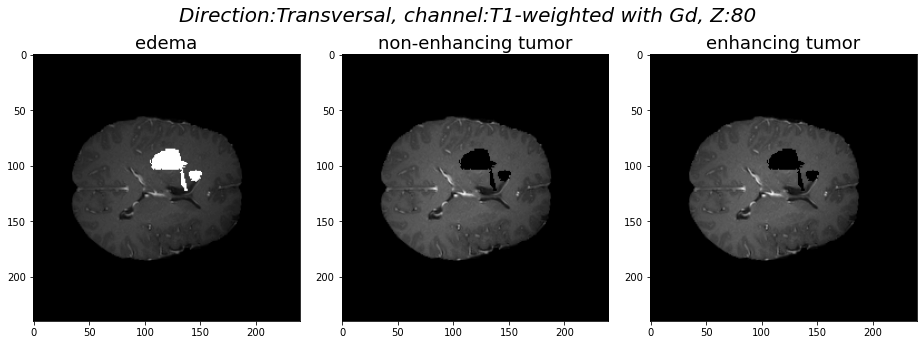

(240, 240, 155, 4)
(240, 240, 155)


In [0]:
#Load DICOM data
test_sample = "BRATS_011.nii.gz"
img_path = os.path.join(IMG_DIR, test_sample)
lab_path = os.path.join(LAB_DIR, test_sample)
img, lab = load_case(img_path, lab_path)
#Show the data
labeled_img = get_labeled_image(img, lab, 2, NUM_CH)
draw_labeled_image(labeled_img, CHANNEL, LABEL, channel_num = 2, axis='z',index = 80)
print(img.shape)
print(lab.shape)

<a name="2.2"></a>
## 2-2 Sub-volume sampling
Due to the GPU memory limit, we will now divide the raw images (240, 240, 155, 4) into patches (120, 120, 32).

- Note that in order to let training be more efficient, we will use threshold for background to make sure it contains some abnormal area for training.

The following code will give a look of the choosen patch of the last image.

Accepted after 1 times for finding sub-volume ...


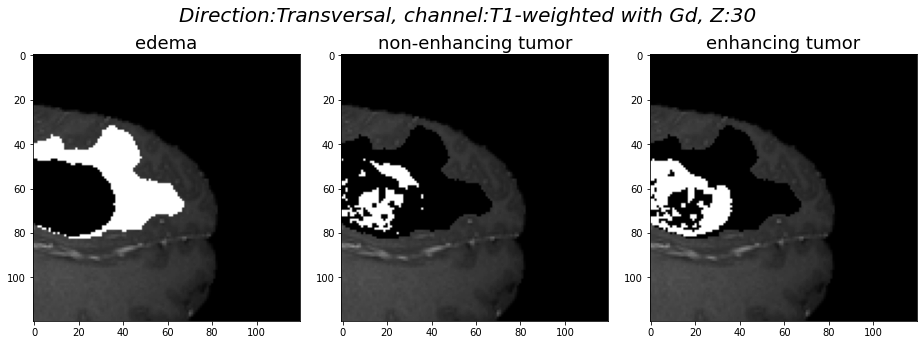

In [0]:
#Extract & show sub-volume
sub_img, sub_lab, _ = get_sub_volume(img, lab, output_dim = input_sub_dim, bk_thres = 0.95, to_channel_first = True)
labeled_img_sub = get_labeled_image(sub_img, sub_lab, 2, NUM_CH, channel_first = True)
draw_labeled_image(labeled_img_sub, CHANNEL, LABEL, channel_num = 2, axis='z', index = 30)

The following code in used to split the train and validation set from `dataset.json` (included in the download dataset)

The cross-validation is not performed here due to large time consumption. One can change the validation set with the last code.

In [0]:
#Read the json file with train_val, test info 
with open(DATA_DIR + "/dataset.json") as f:
    config = json.load(f)
#Devide the train_val list to folds
folds, n_fold, n_sample = get_train_val_split(config, val_split)
print(f"Validation Splits: {val_split}")
print(f"Available folds for validation : {n_fold}")
print(f"Samples in each fold: {n_sample}")
#chose the index zero to be validation set
train_fold, val_fold = set_train_val_split(folds, 0)

Validation Splits: 0.2
Available folds for validation : 5
Samples in each fold: 96


<a name="2.3"></a>
## 2-3 Normalization
We normalization the data by substracting the mean and devided by the standard deviation. 
- Note that we only normalize the data within brain area !

For convenience, we pre-calculate the mean and std for each sample within brain area and save it as a json file.

- It might take some times, so unlock the code to start.

In [0]:
#Using generator to create smaples in advance (Optional)
#get sample mean & std json file for norm mode = 2
output_file_name = 'samples_mean_std.json'
#get_samples_brain_area_mean_std_json(IMG_DIR, num_ch = 4, output_file_name = output_file_name)

Now we can create the patches using the generator defined in generator.py.

The threshold is 0.95 here, and if the image can not meet the threshold after maximum tries, the image will be skip. The default patches for each sample is 2. Also, the normalization is done in this process.

In the end, we will save the list with default name `path_list.json` for future usage.

- It might take some times, so unlock the code to start.

In [0]:
#create patchces (optional)
pre_dir = 'preprocess_BAN'  #Brain Area Normalization
#json_file = os.path.join(IMG_DIR, output_file_name)
#train_patch_list = create_h5py_pathes(DATA_DIR, train_fold, 'train', input_dim, input_sub_dim, bk_thres = 0.95, pre_dir = pre_dir, skip = True, 
#                                      pre_process = True, norm_mode = 2, sample_mean_std_json = json_file, max_tries = 50, sample_batch_size = 30, sample_each_image = 2)
#val_patch_list = create_h5py_pathes(DATA_DIR, val_fold, 'validation', input_dim, input_sub_dim, bk_thres = 0.95, pre_dir = pre_dir, skip = True, 
#                                      pre_process = True, norm_mode = 2, sample_mean_std_json = json_file, max_tries = 50, sample_batch_size = 30, sample_each_image = 2)
#Save patch list
#patch_list = {'train': train_patch_list, 'validation': val_patch_list}
#ret = json.dumps(patch_list)
#with open(os.path.join(pre_dir, 'path_list.json'), 'w') as fp:
#    fp.write(ret)

In [0]:
#If you fail to catch the return value, using the following code to save the file list
#train_patch_list = os.listdir('preprocess/train')
#val_patch_list   = os.listdir('preprocess/validation')
#patch_list = {'train': train_patch_list, 'validation': val_patch_list}
#ret = json.dumps(patch_list)
#with open(os.path.join(pre_dir, 'path_list.json'), 'w') as fp:
#    fp.write(ret)

Now create generator for training and validation.
The generator wil load the data from patches (in path_list.json) which are already normalized.

In [0]:
#Create generator for reading pathches
with open(os.path.join(pre_dir, 'path_list.json'), 'r') as fp:
    config = json.load(fp)
#change the mean std info json data to your own
#jpath = '/content/drive/My Drive/小瑋/3DUet-Brain/Task01_BrainTumour/imagesTr/samples_mean_std.json'
train_gen = VolumeDataGenerator(config['train'], os.path.join(pre_dir, 'train'), batch_size = 4, output_dim = input_sub_dim, pre_process = False, from_patches = True, exclude_background = False)
#train_gen = VolumeDataGenerator(train_fold, DATA_DIR, batch_size = 4, output_dim = input_sub_dim, pre_process = True, norm_mode = 2, sample_mean_std_json = jpath, from_patches = False, exclude_background = False, bk_thres=0.99, max_tries=100)
val_gen   = VolumeDataGenerator(config['validation'], os.path.join(pre_dir, 'validation'), batch_size = 4, output_dim = input_sub_dim, pre_process = False, from_patches = True, shuffle = False, exclude_background = False)

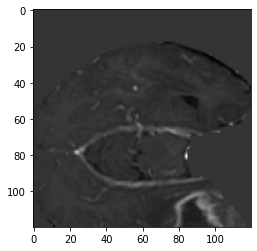

In [0]:
#Take a look at a normalized patch
plt.imshow(train_gen[0][0][2][2,:,:,0], cmap = 'gray')

<a name="3"></a>
# 3. Model and Loss Function
<a name="3.1"></a>
## 3-1 Model Structure:

  The model with has contraction and expanding path with depth 4. The input shape in (120, 120, 32) in our case. The details are in model.py
<img src="https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/u-net-architecture.png" width="80%">

<a name="3.2"></a>
## 3-2 Loss : Multi-class soft dice loss

$$\mathcal{L}_{Dice}(p, q) = 1 - \frac{1}{N} \sum_{c=1}^{C} \frac{2\times\sum_{i, j} p_{cij}q_{cij} + \epsilon}{\left(\sum_{i, j} p_{cij}^2 \right) + \left(\sum_{i, j} q_{cij}^2 \right) + \epsilon}$$

  The soft dice loss can handle class imbalance better than typical cross-entropy loss function. 
- $p$ is our predictions
- $q$ is the ground truth
- $N$ is the number of class 
- In practice each $q_i$ will either be 0 or 1. 
- $\epsilon$ is a small number that is added to avoid division by zero

The soft Dice loss ranges between 
- 0: perfectly matching the ground truth distribution $q$
- 1: complete mismatch with the ground truth.
    

In [0]:
#Build the model
model = unet_model_3d(loss_function=soft_dice_loss, num_lab = NUM_LAB, batch_normalization = True,
                      activation_name = 'softmax', depth = 4, input_shape = (NUM_CH, *input_sub_dim))

<a name="4"></a>
# 4. Training
We do the training from scratch. The initial learing rate is 1e-5.

The loss function is customized for soft dice loss. (see 3.)

The evaluation metrics used is dice_coefficient: 
$$\text{DSC}(A, B) = \frac{2 \times |A \cap B|}{|A| + |B|}.$$
or in other form:

$$\text{DSC}(f, x, y) = \frac{2 \times \sum_{i, j} f(x)_{ij} \times y_{ij} + \epsilon}{\sum_{i,j} f(x)_{ij} + \sum_{i, j} y_{ij} + \epsilon}$$

- $x$ : the input image
- $f(x)$ : the model output (prediction)
- $y$ : the label (actual ground truth)

In [0]:
#Define callbacks
from datetime import date
day = str(date.today())
day = '2020-05-30'
callbacks = [EarlyStopping(monitor='val_loss', patience=30, verbose=1),
             ModelCheckpoint(f'Model_weights_{day}_L4_softmax.h5', save_best_only=True, save_weights_only=True),
             ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, verbose=1, min_lr=1e-7),
             CSVLogger(f'log_{day}_L4_softmax.csv', separator=",", append=True)]

In [0]:
#Complie the model
model.compile(optimizer=Adam(lr = 1e-5), loss=soft_dice_loss, metrics=[dice_coefficient])

Using the generator to extract patches and do the training.

In [0]:
#model.fit_generator(train_gen,
#        steps_per_epoch=len(train_gen),
#        epochs= 200,
#        validation_data=val_gen,
#        validation_steps=len(val_gen),
#        callbacks = callbacks,
#        use_multiprocessing=True)

Draw the changes of dice loss and dice coefficient

Text(0.5, 1.0, 'dice_coefficient')

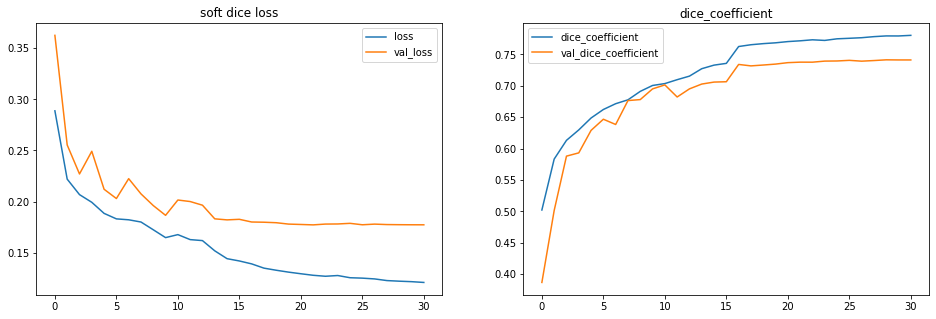

In [0]:
#Draw the output csv file
import pandas as pd
#history = pd.read_csv('log_2020-05-30_L4_softmax.csv')
history = pd.read_csv('log_2020-05-30_L4_softmax.csv')
fig, ax = plt.subplots(1, 2, figsize = (16, 5))
#soft dice loss
ax[0].plot(history['loss'])
ax[0].plot(history['val_loss'])
ax[0].legend(['loss', 'val_loss'])
ax[0].set_title('soft dice loss')
#dice coefficient
ax[1].plot(history['dice_coefficient'])
ax[1].plot(history['val_dice_coefficient'])
ax[1].legend(['dice_coefficient', 'val_dice_coefficient'])
ax[1].set_title('dice_coefficient')

<a name="5"></a>
# 5. Evaluate the result
In this chapter we will check the performance and visualize the result.

My pre-trained weigths can be downloaded [here](https://drive.google.com/open?id=1-03dFqzq9gIT1L7ThwpyjjjcHy7pybFg)

<a name="5.1"></a>
## 5.1 Input for Predtion
In the prediction stage, we still have to devide the raw images into patches and then recombine the result.

Since we only predict one raw image at a time, we can change the input sub-volume to the larger one (based on your GPU memory). In this case, we can alleviate the effect of missing surrounding infomation and get better result.

In this case, we will change the sub-volume input to shape (240, 240, 64). We need to create a new model with this input shape but loading the previous trained weights.

In [0]:
#Load the interested DICOM data from validation set
test_sample = val_fold[3]['image'].split('/')[-1]
print(f"Loading sample {test_sample}")
img_path = os.path.join(IMG_DIR, test_sample)
lab_path = os.path.join(LAB_DIR, test_sample)
img, lab = load_case(img_path, lab_path)
#Make new model with differnt input shape but with same weights
pred_sub_dim = (240, 240, 64)
model_p = unet_model_3d(loss_function=soft_dice_loss, num_lab = NUM_LAB, batch_normalization = True,
                      activation_name = 'softmax', depth = 4, input_shape = (NUM_CH, *pred_sub_dim))
#Load & Save weights
day = '2020-05-30'
model_p.load_weights(f'Model_weights_{day}_L4_softmax.h5')

Loading sample BRATS_043.nii.gz


Now, the raw image will be normalized and then predicted by model in the following code.

Using loc = (x, y, z) parameters to choose specific slices. 

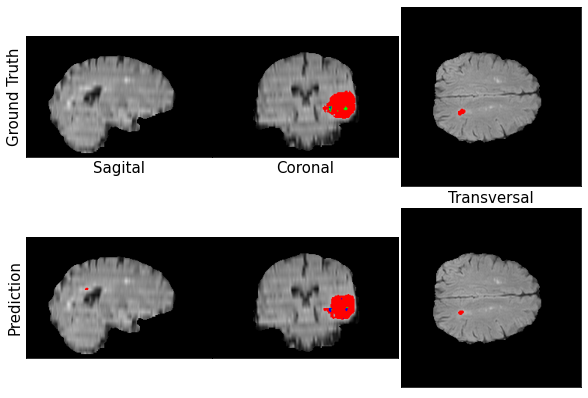

In [0]:
#Read the std & mean info for normalization
json_file = os.path.join(IMG_DIR, output_file_name)
with open(json_file) as f:
  info_dict = json.load(f)
#predict and visulized the specific slice, the predicted label will be return
model_label  = predict_and_viz(img, lab, model_p, 4, ch_info = info_dict[test_sample], loc=(100, 100, 100), input_dim=(240, 240, 155), input_sub_dim = pred_sub_dim)

Using the code below to show the predicted label in specific z slice.

In [0]:
compare_true_pred_image(img, lab,  model_label, CHANNEL, LABEL, show_z = 100)

<a name="5.2"></a>
## 5.2 Sensitivity and specitivity
Now we can check the sensitivity and specificity of the image.
The discrimination between non-enhancing tumor and enhancing tumor is usually more difficult. The tumor here means combining non-enhaceing and enhancing as one type. 

In [0]:
get_sen_spec_df(to_categorical(model_label, num_classes=4), to_categorical(lab, num_classes=4), LABEL)

,background,edema,non-enhancing tumor,enhancing tumor,tumor
Sensitivity,0.999492,0.740257,0.499436,0.877285,0.847055
Specificity,0.793036,0.999302,0.999854,0.999815,0.999909


<a name="5.3"></a>
## 5.3 Visualization
The following code shows the gif animation along specific direction.
The left is ground truth and the right is the predicted label.
- Red: Edema
- green: non-enhancing tumor
- blue: enhancing tumor

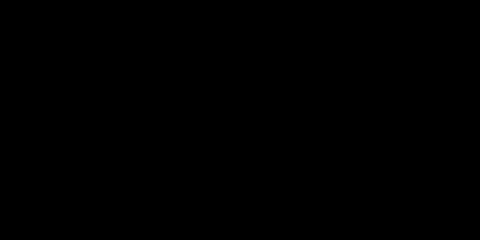

In [0]:
visualize_comparison_gif(get_labeled_image(img, lab, 1, 4), get_labeled_image(img, model_label, 1, 4), 'z')

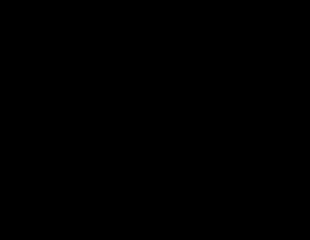

In [0]:
visualize_comparison_gif(get_labeled_image(img, lab, 0, 4), get_labeled_image(img, model_label, 0, 4), 'x')

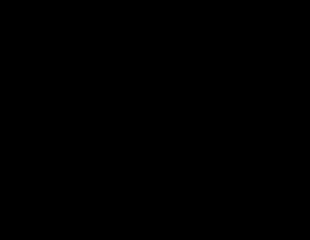

In [0]:
visualize_comparison_gif(get_labeled_image(img, lab, 0, 4), get_labeled_image(img, model_label, 0, 4), 'y')